<a href="https://colab.research.google.com/github/Swicano/IntroML_NBs/blob/master/LSTM_Signal_predict.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from keras import *
from keras.models import Sequential
from keras.layers import Dense, LSTM

Using TensorFlow backend.


In [0]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [0]:
def Gen_signal(length = 1000, terms = 1, min_period = 50, noise_in=0, noise_out=0):
  start = int(np.random.triangular(0,0.25*length,0.75*length))
  sig_in = np.zeros([length,1])
  sig_out = np.zeros([length,1])
  freqs = 2*np.pi/np.random.randint(min_period,int(length/3),size=(terms,1))
  phase = 2*np.pi*np.random.ranf(size=(terms,1))
  x_in = np.arange(length)
  x_out = np.arange(length,2*length)
  y_in = np.sum(np.sin(freqs*x_in+phase), axis=0)/(terms+1)
  y_in[:start] = 0
  y_in = y_in + noise_in*np.random.random(length)
  y_out = np.sum(np.sin(freqs*x_out+phase), axis=0)/(terms+1)
  y_out = y_out + noise_out*np.random.random(length)
  
  return y_in, y_out

In [0]:
def Gen_batch(batchsize=1000, length = 1000, terms = 1, min_period = 50, noise_in=0, noise_out=0):
  start = np.random.triangular(0,0.25*length,0.75*length, size=(batchsize,1)).astype(int)
  sig_in = np.zeros([batchsize,length,1])
  sig_out = np.zeros([batchsize,length,1])
  freqs = 2*np.pi/np.random.randint(min_period,int(length/3),size=(batchsize,terms,1))
  phase = 2*np.pi*np.random.ranf(size=(batchsize,terms,1))
  x_in = np.arange(length)
  x_outx = np.arange(1,length+1).reshape(1,length) # to shift w/ input
  #x_outx = length*np.ones([1,length]) # to not shift w/ input
  x_outy = np.arange(length).reshape(length,1)
  x_out = np.add(x_outx, x_outy)
  y_in = np.sum(np.sin(freqs*x_in+phase), axis=1)/(terms+1)
  for i in range(batchsize):
     y_in[i,:start[i,0]] = 0
  y_in = y_in + noise_in*np.random.random(size=(batchsize,length))
  y_out = np.sum(np.sin(freqs[...,np.newaxis]*x_out+phase[...,np.newaxis]), axis=1)/(terms+1)
  y_out = y_out + noise_out*np.random.random(size=(batchsize,length,length))
  return y_in[...,np.newaxis], y_out

In [0]:
def Generator_batch(batchsize=1000, length = 1000, terms = 1, min_period = 50, noise_in=0, noise_out=0):
  while True:
    start = np.random.triangular(0,0.25*length,0.75*length, size=(batchsize,1)).astype(int)
    sig_in = np.zeros([batchsize,length,1])
    sig_out = np.zeros([batchsize,length,1])
    freqs = 2*np.pi/np.random.randint(min_period,int(length/3),size=(batchsize,terms,1))
    phase = 2*np.pi*np.random.ranf(size=(batchsize,terms,1))
    x_in = np.arange(length)
    x_outx = np.arange(1,length+1).reshape(1,length) # to shift w/ input
    #x_outx = length*np.ones([1,length]) # to not shift w/ input
    x_outy = np.arange(length).reshape(length,1)
    x_out = np.add(x_outx, x_outy)
    y_in = np.sum(np.sin(freqs*x_in+phase), axis=1)/(terms+1)
    y_out = np.sum(np.sin(freqs[...,np.newaxis]*x_out+phase[...,np.newaxis]), axis=1)/(terms+1)
    for i in range(batchsize):
       y_in[i,:start[i,0]] = 0
    y_in = y_in + noise_in*np.random.random(size=(batchsize,length))
    y_out = y_out + noise_out*np.random.random(size=(batchsize,length,length))
    yield y_in[...,np.newaxis], y_out

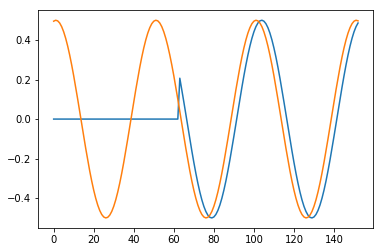

(3, 153, 1)


In [0]:
bob, bob2 = Gen_batch(batchsize = 3, length=153,terms=1, noise_in=0.00, noise_out=0.00)
plt.plot(bob[0,:])
plt.plot(bob2[0,::-1,-1])
#plt.plot(bob[2,:])
plt.show()
print(np.shape(bob))

In [0]:
batch=80
siglen = 500
val_in, val_out = Gen_batch(batchsize = batch, length=siglen,terms=1, noise_in=0.00, noise_out=0.00)
print(np.shape(val_out))

(80, 500, 500)


(80, 500, 1)


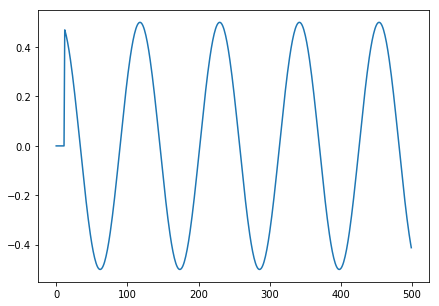

In [0]:
valval = 14
print(np.shape(val_in))
test_in = val_in[valval,:]
fig=plt.figure(figsize=(7,5))
plt.plot(test_in)
plt.show()

In [0]:
net=Sequential()
net.add(LSTM(50, batch_input_shape=[None,siglen,1], return_sequences=True))
net.add(LSTM(siglen, return_sequences=True))
net.compile(loss='mean_squared_error',optimizer='adam', metrics=['accuracy'])
net.summary()

W0704 22:51:36.895631 139720389658496 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0704 22:51:36.942475 139720389658496 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0704 22:51:36.950233 139720389658496 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0704 22:51:38.007874 139720389658496 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.



_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 500, 50)           10400     
_________________________________________________________________
lstm_2 (LSTM)                (None, 500, 500)          1102000   
Total params: 1,112,400
Trainable params: 1,112,400
Non-trainable params: 0
_________________________________________________________________


In [0]:
numeps = 5 # number of epochs
steps = 25

H = net.fit_generator(Generator_batch(batchsize = 100, length=siglen,terms=1, noise_in=0.00, noise_out=0.00),
	validation_data=(val_in, val_out), steps_per_epoch=steps,
	epochs=numeps)

Epoch 1/5
25/25 [==============================] - 295s 12s/step - loss: 0.0865 - acc: 0.0209 - val_loss: 0.0872 - val_acc: 0.0203
Epoch 2/5
25/25 [==============================] - 282s 11s/step - loss: 0.0868 - acc: 0.0215 - val_loss: 0.0903 - val_acc: 0.0168
Epoch 3/5
25/25 [==============================] - 282s 11s/step - loss: 0.0892 - acc: 0.0193 - val_loss: 0.0859 - val_acc: 0.0212
Epoch 4/5
25/25 [==============================] - 282s 11s/step - loss: 0.0889 - acc: 0.0210 - val_loss: 0.0860 - val_acc: 0.0191
Epoch 5/5
25/25 [==============================] - 282s 11s/step - loss: 0.0854 - acc: 0.0204 - val_loss: 0.0826 - val_acc: 0.0184


In [0]:
ep = 32
test_output = np.zeros([300, siglen,siglen])
test_output[ep,:,:] = net.predict_on_batch(val_in[0:20,...])[valval,:,:]

In [0]:
# train batch by batch if you like
epochs = 0
ep = 14
#test_output = np.zeros([300, siglen,siglen])
#test_output[0,:,:] = net.predict_on_batch(val_in[0:2,...])[valval,:,:]
for k in range(epochs):
  train_in, train_out = Gen_batch(batchsize = 100, length=siglen,terms=1, noise_in=0.00, noise_out=0.00)  # training data
  #print(np.shape(train_in),np.shape(train_out))
  bnet = net.train_on_batch(train_in, train_out)
  if (k % 1 <1):
    print(k, bnet)
test_output[ep,:,:] = net.predict_on_batch(val_in[0:20,...])[valval,:,:]

(80, 500, 1)


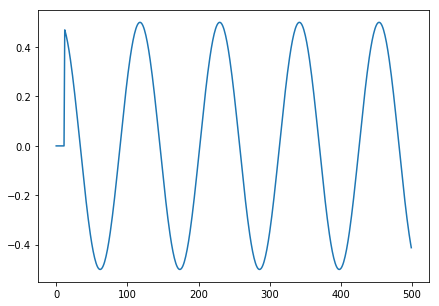

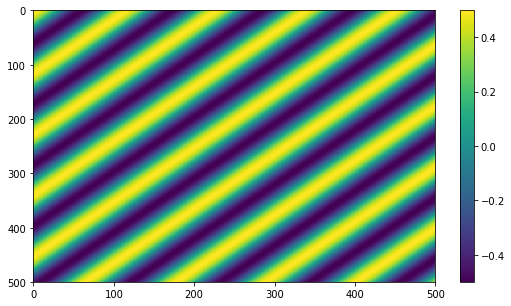

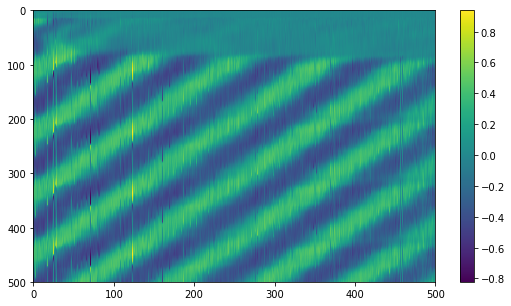

(80, 500, 1)


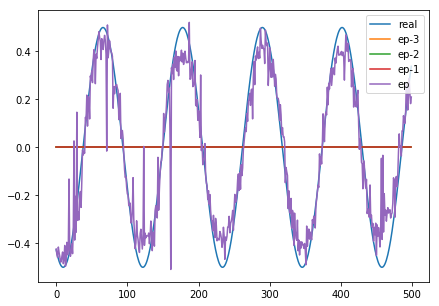

In [0]:
print(np.shape(val_in))
test_in = val_in[valval,:]
fig=plt.figure(figsize=(7,5))
plt.plot(test_in)
plt.show()

fig=plt.figure(figsize=(9,5))
val_outZ = val_out[valval,:,:].T
plt.imshow(val_outZ,origin='upper',interpolation='nearest',aspect='auto')
plt.colorbar()
plt.show()

fig=plt.figure(figsize=(9,5))
test_out = test_output[ep,:,:]
plt.imshow(test_out,origin='upper',interpolation='nearest',aspect='auto')
plt.colorbar()
plt.show()

print(np.shape(val_in))
fig=plt.figure(figsize=(7,5))
plt.plot(val_out[valval,-1,:])
plt.plot(test_output[ep-3,-1,:])
plt.plot(test_output[ep-2,-1,:])
plt.plot(test_output[ep-1,-1,:])
plt.plot(test_output[ep,-1,:])
plt.legend(['real','ep-3','ep-2','ep-1','ep'])
plt.show()

In [0]:
from matplotlib import animation, rc
from IPython.display import HTML

# First set up the figure, the axis, and the plot element we want to animate
fig, ax = plt.subplots()
plt.close()

ax.set_xlim(( -siglen, siglen))
ax.set_ylim((-1, 1))

line1, = ax.plot([], [], lw=2)
line2, = ax.plot([], [], lw=2)
line3, = ax.plot([], [], lw=1)

# initialization function: plot the background of each frame
def init():
    line1.set_data([], [])
    line2.set_data([], [])
    line3.set_data([], [])
    return (line3,line2,line1,)

# animation function. This is called sequentially  
def animate(i):
    x1 = np.arange(siglen)
    y1 = test_output[ep,i,:]
    line1.set_data(x1, y1)
    
    x2 = np.arange(-i,0,1)
    y2 = val_in[valval,:i]
    line2.set_data(x2, y2)
    
    x3 = np.arange(siglen)
    y3 = val_out[valval,i,:]
    line3.set_data(x3, y3)
    
    return (line3,line2,line1,)
  

anim = animation.FuncAnimation(fig, animate, init_func=init,
                             frames=siglen, interval=66, blit=True)

# Note: below is the part which makes it work on Colab
rc('animation', html='jshtml')
anim

In [0]:

#Writer = animation.writers['ffmpeg']
#writer = Writer(fps=15, metadata=dict(artist='Me'), bitrate=4000)

from matplotlib.animation import PillowWriter
writer=PillowWriter(fps=15)
anim.save('im5.gif', writer=writer)
